In [1]:
!pip install rasterio kornia kornia_moons opencv-python-headless torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 84.3 MB/s eta 0:00:00


In [2]:
import os
from glob import glob
import matplotlib.pyplot as plt
import gc
import sys
import cv2
from typing import Dict, Optional
import argparse

import kornia as K
import kornia.feature as KF
import kornia_moons.feature as KMF

import numpy as np
from kornia.feature.adalam import AdalamFilter
from kornia_moons.viz import *

import torch
import torch.nn as nn

import torch

INSTALLED_LOG = {}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Kornia LoFTR

In [3]:
class LoFTRMatcher:
    def __init__(self, device=None, input_longside=1200, conf_th=None):
        self.device = device
        self.matcher = K.feature.LoFTR(pretrained='outdoor').eval().to(self.device)
        self.input_longside = input_longside
        self.conf_thresh = conf_th
        
    def prep_img(self, img, long_side=1200):
        if long_side is not None:
            scale = long_side / max(img.shape[0], img.shape[1]) 
            w = int(img.shape[1] * scale)
            h = int(img.shape[0] * scale)
            img = cv2.resize(img, (w, h))
        else:
            scale = 1.0

        img_ts = K.image_to_tensor(img, False).float() / 255.
        img_ts = K.color.bgr_to_rgb(img_ts)
        img_ts = K.color.rgb_to_grayscale(img_ts)
        return img, img_ts.to(self.device), scale
    
    def tta_rotation_preprocess(self, img_np, angle):
        rot_M = cv2.getRotationMatrix2D((img_np.shape[1] / 2, img_np.shape[0] / 2), angle, 1)
        rot_M_inv = cv2.getRotationMatrix2D((img_np.shape[1] / 2, img_np.shape[0] / 2), -angle, 1)
        rot_img = cv2.warpAffine(img_np, rot_M, (img_np.shape[1], img_np.shape[0]))

        rot_img_ts = K.image_to_tensor(rot_img, False).float() / 255.
        rot_img_ts = K.color.bgr_to_rgb(rot_img_ts)
        rot_img_ts = K.color.rgb_to_grayscale(rot_img_ts)
        return rot_M, rot_img_ts.to(self.device), rot_M_inv

    def tta_rotation_postprocess(self, kpts, img_np, rot_M_inv):
        ones = np.ones(shape=(kpts.shape[0], ), dtype=np.float32)[:, None]
        hom = np.concatenate([kpts, ones], 1)
        rot_kpts = rot_M_inv.dot(hom.T).T[:, :2]
        mask = (rot_kpts[:, 0] >= 0) & (rot_kpts[:, 0] < img_np.shape[1]) & (rot_kpts[:, 1] >= 0) & (rot_kpts[:, 1] < img_np.shape[0])
        return rot_kpts, mask

    def __call__(self, img_np1, img_np2, tta=['orig']):
        with torch.no_grad():
            img_np1, img_ts0, scale0 = self.prep_img(img_np1, long_side=self.input_longside)
            img_np2, img_ts1, scale1 = self.prep_img(img_np2, long_side=self.input_longside)
            images0, images1 = [], []

            # TTA
            for tta_elem in tta:
                if tta_elem == 'orig':
                    img_ts0_aug, img_ts1_aug = img_ts0, img_ts1
                elif tta_elem == 'flip_lr':
                    img_ts0_aug = torch.flip(img_ts0, [3, ])
                    img_ts1_aug = torch.flip(img_ts1, [3, ])
                elif tta_elem == 'flip_ud':
                    img_ts0_aug = torch.flip(img_ts0, [2, ])
                    img_ts1_aug = torch.flip(img_ts1, [2, ])
                elif tta_elem == 'rot_r10':
                    rot_r10_M0, img_ts0_aug, rot_r10_M0_inv = self.tta_rotation_preprocess(img_np1, 10)
                    rot_r10_M1, img_ts1_aug, rot_r10_M1_inv = self.tta_rotation_preprocess(img_np2, 10)
                elif tta_elem == 'rot_l10':
                    rot_l10_M0, img_ts0_aug, rot_l10_M0_inv = self.tta_rotation_preprocess(img_np1, -10)
                    rot_l10_M1, img_ts1_aug, rot_l10_M1_inv = self.tta_rotation_preprocess(img_np2, -10)
                else:
                    raise ValueError('Unknown TTA method.')
                images0.append(img_ts0_aug)
                images1.append(img_ts1_aug)

            # Inference
            input_dict = {"image0": torch.cat(images0), "image1": torch.cat(images1)}
            correspondences = self.matcher(input_dict)
            mkpts0 = correspondences['keypoints0'].cpu().numpy()
            mkpts1 = correspondences['keypoints1'].cpu().numpy()
            batch_id = correspondences['batch_indexes'].cpu().numpy()
            confidence = correspondences['confidence'].cpu().numpy()

            # Reverse TTA
            for idx, tta_elem in enumerate(tta):
                batch_mask = batch_id == idx

                if tta_elem == 'orig':
                    pass
                elif tta_elem == 'flip_lr':
                    mkpts0[batch_mask, 0] = img_np1.shape[1] - mkpts0[batch_mask, 0]
                    mkpts1[batch_mask, 0] = img_np2.shape[1] - mkpts1[batch_mask, 0]
                elif tta_elem == 'flip_ud':
                    mkpts0[batch_mask, 1] = img_np1.shape[0] - mkpts0[batch_mask, 1]
                    mkpts1[batch_mask, 1] = img_np2.shape[0] - mkpts1[batch_mask, 1]
                elif tta_elem == 'rot_r10':
                    mkpts0[batch_mask], mask0 = self.tta_rotation_postprocess(mkpts0[batch_mask], img_np1, rot_r10_M0_inv)
                    mkpts1[batch_mask], mask1 = self.tta_rotation_postprocess(mkpts1[batch_mask], img_np2, rot_r10_M1_inv)
                    confidence[batch_mask] += (~(mask0 & mask1)).astype(np.float32) * -10.
                elif tta_elem == 'rot_l10':
                    mkpts0[batch_mask], mask0 = self.tta_rotation_postprocess(mkpts0[batch_mask], img_np1, rot_l10_M0_inv)
                    mkpts1[batch_mask], mask1 = self.tta_rotation_postprocess(mkpts1[batch_mask], img_np2, rot_l10_M1_inv)
                    confidence[batch_mask] += (~(mask0 & mask1)).astype(np.float32) * -10.
                else:
                    raise ValueError('Unknown TTA method.')
                    
            if self.conf_thresh is not None:
                th_mask = confidence >= self.conf_thresh
            else:
                th_mask = confidence >= 0.
            mkpts0, mkpts1 = mkpts0[th_mask, :], mkpts1[th_mask, :]

            # Matching points
            return mkpts0 / scale0, mkpts1 / scale1
        

# 1200 is the validation size, according to the paper
loftr_matcher = LoFTRMatcher(device=device, input_longside=1200, conf_th=0.3)

Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_outdoor.ckpt" to /root/.cache/torch/hub/checkpoints/loftr_outdoor.ckpt
100%|██████████| 44.2M/44.2M [00:03<00:00, 15.3MB/s]


# Inference

In [4]:
import os

images_num = 0
image_names_dict = {}

for dirname, _, filenames in os.walk('../input/deforestation-in-ukraine'):
    for filename in filenames:
        if filename.endswith('_TCI.jp2'):
            images_num += 1 
            if dirname not in image_names_dict:
                image_names_dict[dirname] = list()
            image_names_dict[dirname].append(filename)

print(images_num)

50


In [5]:
image_paths_list = [os.path.join(dirname, filename) for dirname, filenames in image_names_dict.items() for filename in filenames]


In [6]:
import rasterio
from rasterio.plot import reshape_as_image

# Indexes of images from image_paths_list
#read_image_indexes = list(range(24))
read_image_indexes = [0, 2, 14, 19]

images = []

def read_raster_image(path):
    with rasterio.open(path, "r", driver='JP2OpenJPEG') as src:
        raster_image = src.read()
        raster_meta = src.meta
    raster_image = reshape_as_image(raster_image)
    return raster_image, raster_meta

for i in read_image_indexes:
    image_path = image_paths_list[i]
    image, meta = read_raster_image(image_path)
    images.append(image)

print(f"There were {len(images)} raster images read with shape {images[0].shape} ")

There were 4 raster images read with shape (10980, 10980, 3) 


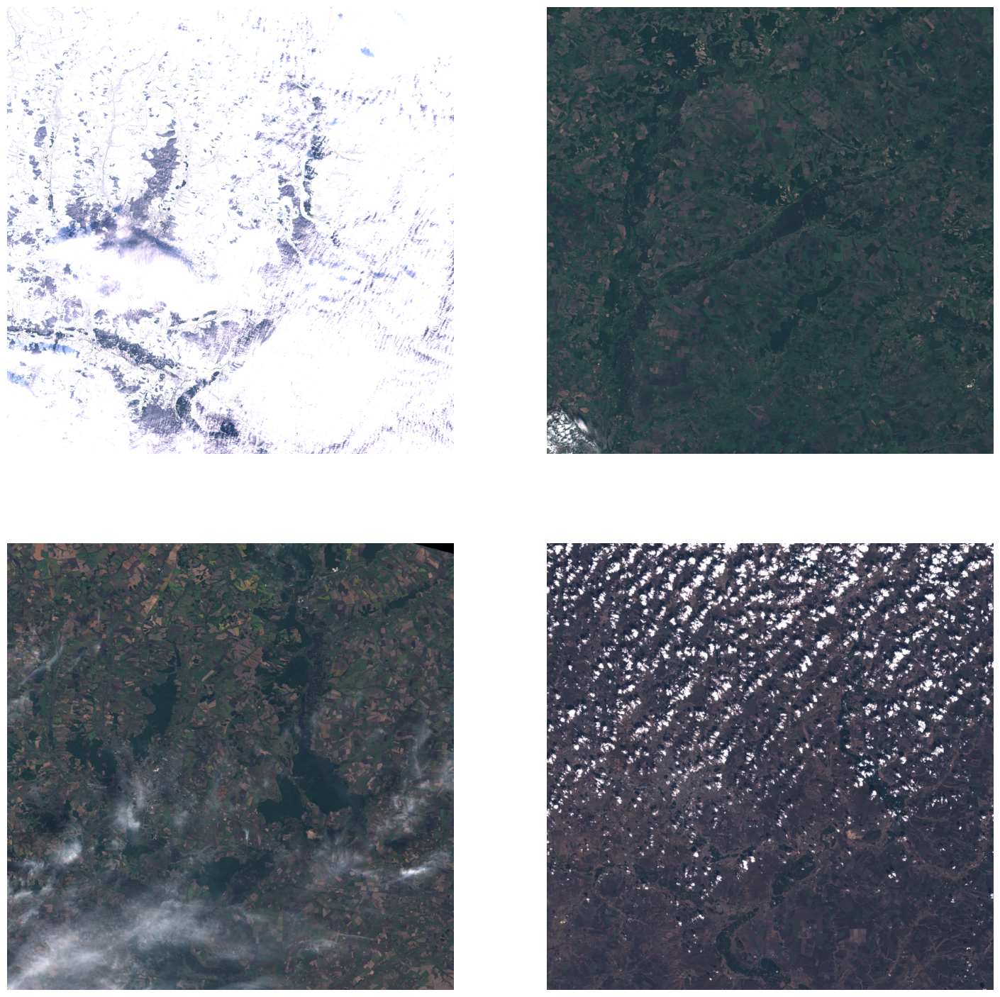

In [7]:
import cv2
import matplotlib.pyplot as plt

# Scale images to 1098x1098 resolution
TARGET_SIZE = (1098, 1098)

dscale_images = [cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA) for img in images]

fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(18, 18))
ax = ax.flatten()

for i in range(len(dscale_images)):
    ax[i].imshow(dscale_images[i])
    ax[i].axis('off')
    
plt.show()

In [8]:
from functools import partial


def match_images(img_np1, img_np2, verbose=0, ret_ims=False):
    st = time.time()

    matchers_cfg = [
        {
            'name': 'loftr',
            'fn': partial(loftr_matcher, ),
        },
    ]
    max_name_len = 0
    mkpts0, mkpts1, runtime_str, kp_count_str = [], [], [], []
    for m_cfg in matchers_cfg:
        max_name_len = max(len(m_cfg['name']), max_name_len)
        m_st = time.time()
        m_mkpts0, m_mkpts1 = m_cfg['fn'](img_np1, img_np2)
        m_nd = time.time()

        mkpts0.append(m_mkpts0)
        mkpts1.append(m_mkpts1)
        runtime_str.append(f'{m_cfg["name"].ljust(max_name_len)}: {m_nd - m_st:06f}s')
        kp_count_str.append(f'{m_cfg["name"]}={len(m_mkpts0)}')

    mkpts0 = np.concatenate(mkpts0)
    mkpts1 = np.concatenate(mkpts1)
  
    if verbose >= 1:
        print("  - Matching:")
        for s in runtime_str:
            print("    -", s)
        print("  - Keypoints:", len(mkpts0), '|', ', '.join(kp_count_str))
    if ret_ims:
        return mkpts0, mkpts1, img_np1, img_np2
    else:
        return mkpts0, mkpts1


class SolutionHolder:
    def __init__(self):
        self.F_dict = dict()
    
    @staticmethod
    def solve_keypoints(mkpts0, mkpts1, verbose=0, ret_inliers=False):
        findmat_st = time.time()
        if len(mkpts0) > 7:
            F, inliers = cv2.findFundamentalMat(mkpts0, mkpts1, cv2.USAC_MAGSAC, 0.2, 0.9999, 250000)
            inliers = inliers > 0
            assert F.shape == (3, 3), 'Malformed F?'
        else:
            F = np.zeros((3, 3))
        findmat_end = time.time()
        if verbose >= 1:
            print('  - Ransac time:', findmat_end - findmat_st, "s")
        if ret_inliers:
            return F, inliers
        else:
            return F

    def add_solution(self, sample_id, mkpts0, mkpts1, verbose=0):
        self.F_dict[sample_id] = SolutionHolder.solve_keypoints(mkpts0, mkpts1, verbose)
  

# Visualize

In [9]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)


Processing Pair 1: Image 0 and Image 19
  - Matching:
    - loftr: 1.599146s
  - Keypoints: 539 | loftr=539
  - Ransac time: 0.0824425220489502 s
  - gc: 0.1335 s
Running time: 2.4227 s

Processing Pair 2: Image 2 and Image 14
  - Matching:
    - loftr: 0.660438s
  - Keypoints: 388 | loftr=388
  - Ransac time: 0.10274195671081543 s
  - gc: 0.1562 s
Running time: 1.2103 s

Processing Pair 3: Image 19 and Image 14
  - Matching:
    - loftr: 0.653923s
  - Keypoints: 988 | loftr=988
  - Ransac time: 0.020375490188598633 s
  - gc: 0.2043 s
Running time: 1.9185 s

Processing Pair 4: Image 0 and Image 2
  - Matching:
    - loftr: 0.651661s
  - Keypoints: 200 | loftr=200
  - Ransac time: 0.441601037979126 s
  - gc: 0.2219 s
Running time: 1.4648 s


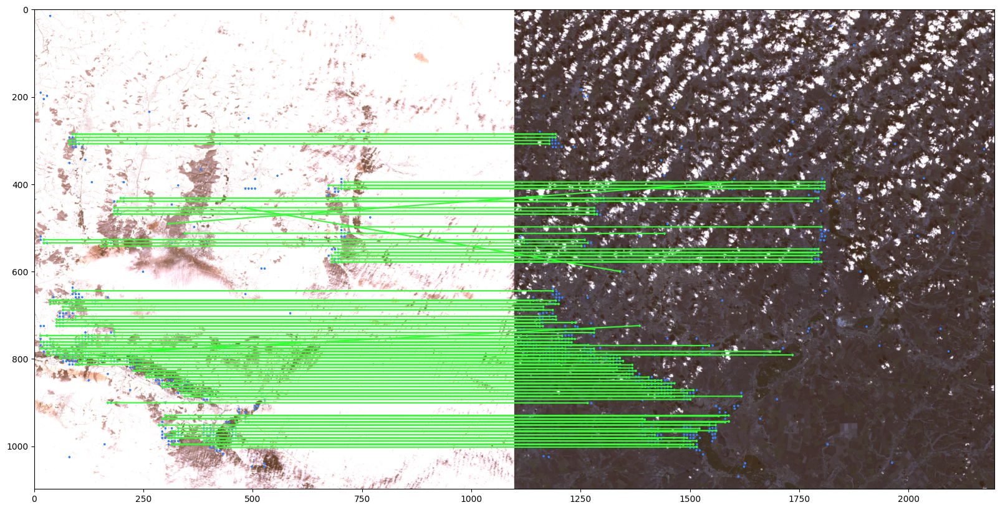

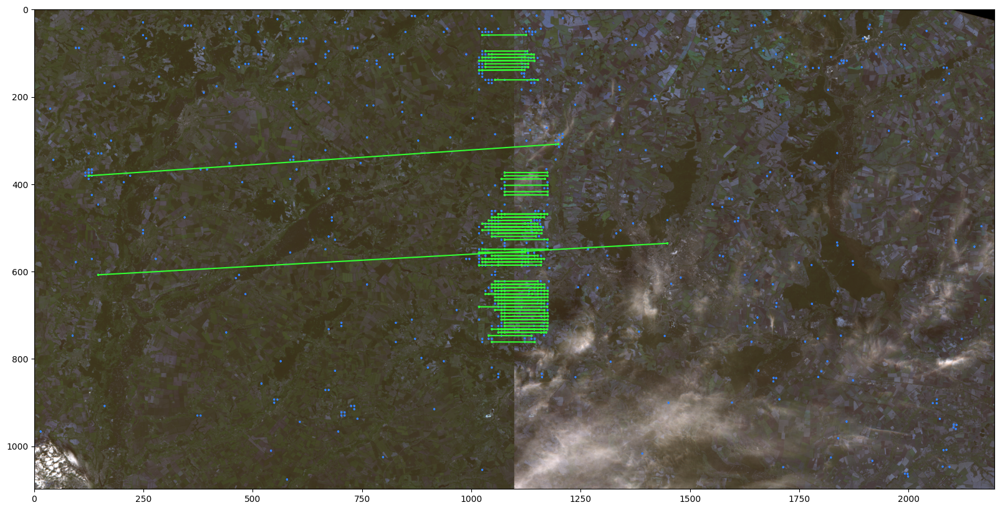

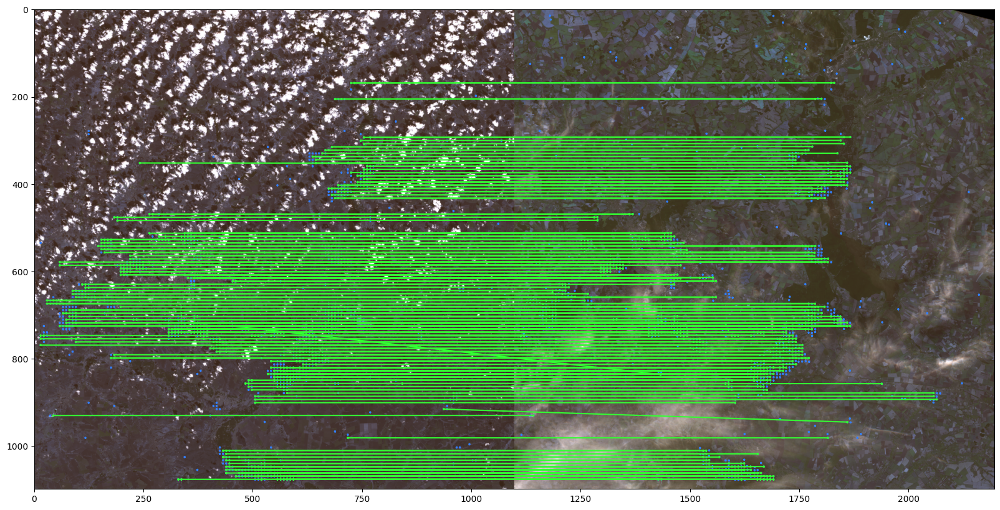

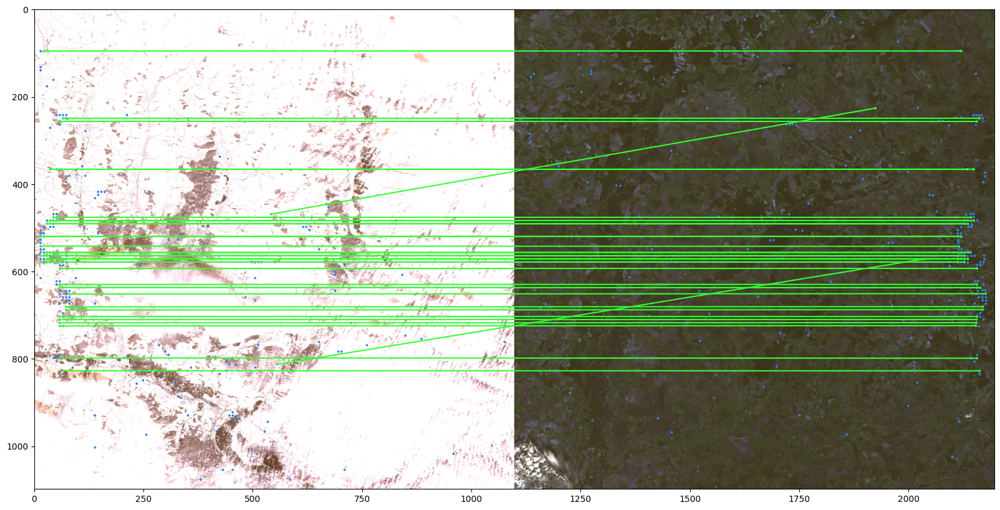

501845

In [10]:
import time

image_pairs = list(zip([0, 2, 19, 0], [19, 14, 14, 2]))
    
for idx, (i1, i2) in enumerate(image_pairs):
    print(f"\nProcessing Pair {idx + 1}: Image {i1} and Image {i2}")
    st = time.time()
    
    # Retrieve Images
    img1, img2 = dscale_images[read_image_indexes.index(i1)], dscale_images[read_image_indexes.index(i2)]
    
    # Matching Keypoints (Replace with your match_images function)
    mkpts0, mkpts1, img_np1, img_np2 = match_images(img1, img2, verbose=1, ret_ims=True)
    F, inliers = SolutionHolder.solve_keypoints(mkpts0, mkpts1, verbose=1, ret_inliers=True)

    # Visualize Matches
    KMF.draw_LAF_matches(
        KF.laf_from_center_scale_ori(torch.from_numpy(mkpts0).view(1,-1, 2),
                                     torch.ones(mkpts0.shape[0]).view(1,-1, 1, 1),
                                     torch.ones(mkpts0.shape[0]).view(1,-1, 1)),
        KF.laf_from_center_scale_ori(torch.from_numpy(mkpts1).view(1,-1, 2),
                                     torch.ones(mkpts1.shape[0]).view(1,-1, 1, 1),
                                     torch.ones(mkpts1.shape[0]).view(1,-1, 1)),
        torch.arange(mkpts0.shape[0]).view(-1,1).repeat(1,2),
        cv2.cvtColor(img1, cv2.COLOR_BGR2RGB),
        cv2.cvtColor(img2, cv2.COLOR_BGR2RGB),
        inliers,
        draw_dict={'inlier_color': (0.2, 1, 0.2),
                   'tentative_color': None, 
                   'feature_color': (0.2, 0.5, 1), 'vertical': False},
    )
    
    gc_st = time.time()
    gc.collect()
    nd = time.time()
    
    print(f"  - gc: {nd - gc_st:.4f} s")
    print(f"Running time: {nd - st:.4f} s")

plt.show()

gc.collect()

### **Further improvement:**
1. **Improve Keypoint Matching Accuracy:**
   - We should try to experiment with parameter tuning in `LoFTR` to optimize performance.
  
2. **Multiple models**
   - Maybe use multiple models for more robust rich matches, but as I've used both  `LoFTR` and `SuperGlue` in `LoFTR + SuperGlue` notebook we could see in the results that `SuperGlue` wasn't feeling very good with satellite images (little to none matches) 

3. **Expand Image Sampling:**
   - Increase the number of image pairs for more comprehensive testing.
   - Use seasonal variability (e.g., summer vs. winter images) to analyze the impact of environmental changes on matching.

4. **Automated Evaluation Metrics:**
   - Compute metrics such as reprojection error, match ratio, and inlier count for quantitative assessment.

5. **Augment Visualization:**
   - Overlay matched keypoints on both images for better interpretability.